In [12]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.colors as mcolors

from pathlib import Path

from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, roc_auc_score


In [ ]:
base_artifacts = Path.cwd().resolve().parents[1] / 'CausalI2I_artifacts'
raw_results = pd.read_csv(base_artifacts / 'Datasets' / 'Evaluated' / 'simulation_evaluated.csv')

figures_path = base_artifacts / 'Figures' / 'simulation'

In [14]:
new_names = {
    'ATE_STABILIZED': 'ATE (stabilized)',
    'ATE_ABLT': 'ABLT',
    'cosine_similarity': 'Cosine',
    'correlation': 'Pearson',
    'diff_of_conditionals': 'DoC',
    'jacard_index': 'Jaccard',
}
raw_results = raw_results.rename(columns=new_names)

standardize = lambda row, col1, col2: row[col1] / np.max([row[col2], 1e-8])
new_cols = {
    "STE": ("ATE", "STD"),
    "ABLT/STD": ("ABLT", "STD_ABLT"),
    "STE (stabilized)": ("ATE (stabilized)", "STD_STABILIZED")
}
for new_col in new_cols:
    col1, col2 = new_cols[new_col]
    raw_results[new_col] = raw_results.apply(standardize, axis=1, args=(col1, col2))

baselines = ["ATE", "STE", "Pearson", "DoC", "ABLT", "ABLT/STD", "Cosine", "Jaccard", "ATE (stabilized)", "STE (stabilized)"]

auxiliary = True

In [15]:
cmap = plt.get_cmap("tab10")
color_map = {}
for i, col in enumerate(baselines):
    base_color = cmap(i % 10)
    if i < 10:
        color_map[col] = base_color
    else:
        c = mcolors.to_rgb(base_color)
        color_map[col] = tuple(min(1, x * 1.4) for x in c)

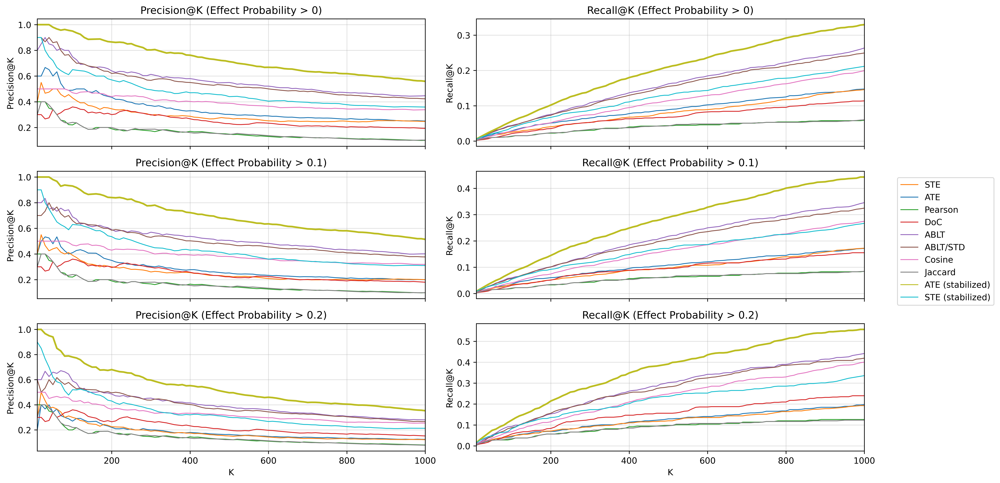

In [16]:
Ks = np.arange(10, 1001, step=10)

thresholds = [0, 0.1, 0.2]

fig, axes = plt.subplots(3, 2, figsize=(14.5, 8), dpi=600, sharex=True)

for row, threshold in enumerate(thresholds):

    # Ground truth
    y_true = raw_results['causal_effect'] > threshold
    total_positives = y_true.sum()

    # Store curves + mean scores
    precision_curves = {}
    recall_curves = {}
    mean_precision = {}
    mean_recall = {}

    # ---- compute curves ----
    for col in baselines:
        col_ser = raw_results.sort_values(by=col, ascending=False)['causal_effect']

        causal_link = col_ser > threshold

        precision_vals = np.array([
            causal_link[:K].sum() / K
            for K in Ks
        ])

        recall_vals = np.array([
            causal_link[:K].sum() / total_positives
            for K in Ks
        ])

        precision_curves[col] = precision_vals
        recall_curves[col] = recall_vals

        mean_precision[col] = precision_vals.mean()
        mean_recall[col] = recall_vals.mean()

    # ---- select best baselines (by mean) ----
    best_precision_col = max(mean_precision, key=mean_precision.get)
    best_recall_col = max(mean_recall, key=mean_recall.get)

    # ---- plot Precision@K ----
    for col in baselines:
        axes[row, 0].plot(
            Ks,
            precision_curves[col],
            color=color_map[col],
            linewidth=2 if col == best_precision_col else 1,
            label=col
        )

    # ---- plot Recall@K ----
    for col in baselines:
        axes[row, 1].plot(
            Ks,
            recall_curves[col],
            color=color_map[col],
            linewidth=2 if col == best_recall_col else 1,
            label=col
        )

    # ---- formatting ----
    axes[row, 0].set_title(f"Precision@K (Effect Probability > {threshold:g})")
    axes[row, 1].set_title(f"Recall@K (Effect Probability > {threshold:g})")

    axes[row, 0].set_ylabel("Precision@K")
    axes[row, 1].set_ylabel("Recall@K")

    for j in range(2):
        axes[row, j].grid(alpha=0.4)
        axes[row, j].set_xlim([Ks[0], Ks[-1]])

# ---- x labels only on bottom row ----
axes[-1, 0].set_xlabel("K")
axes[-1, 1].set_xlabel("K")

# ---- shared legend ----

order = list(range(len(baselines)))
order[0], order[1] = order[1], order[0]

legend_handles = [
    Line2D(
        [0], [0],
        color=axes[0, 0].lines[i].get_color(),
        lw=1,
        label=baselines[i]
    )
    for i in order
]

fig.legend(
    handles=legend_handles,
    labels=[baselines[i] for i in order],
    bbox_to_anchor=(1.01, 0.5),
    loc="center left"
)

plt.tight_layout()
plt.savefig(
    figures_path / 'precision_recall_at_k.jpeg',
    bbox_inches='tight'
)
plt.show()

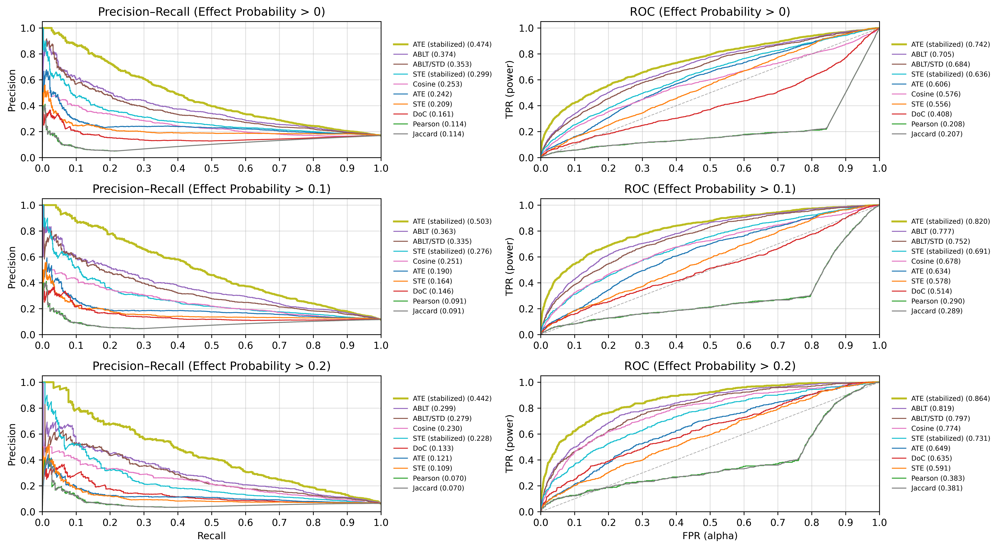

Average Precision                                      \
                   Causal Effect>0 Causal Effect>0.1 Causal Effect>0.2   
ATE                         24.22%            19.04%            12.10%   
STE                         20.94%            16.40%            10.94%   
Pearson                     11.36%             9.15%             7.03%   
DoC                         16.08%            14.64%            13.32%   
ABLT                        37.43%            36.34%            29.92%   
ABLT/STD                    35.28%            33.47%            27.85%   
Cosine                      25.29%            25.07%            22.97%   
Jaccard                     11.35%             9.13%             6.99%   
ATE (stabilized)            47.44%            50.30%            44.24%   
STE (stabilized)            29.89%            27.58%            22.83%   

                         ROC-AUC                                      
                 Causal Effect>0 Causal Effect>0.1 Causal Effect>0.2  
ATE                       60.60%            63.37%            64.88%  
STE                       55.58%            57.79%            59.09%  
Pearson                   20.76%            28.96%            38.26%  
DoC                       40.78%            51.37%            63.54%  
ABLT                      70.53%            77.67%            81.95%  
ABLT/STD                  68.40%            75.18%            79.71%  
Cosine                    57.57%            67.77%            77.40%  
Jaccard                   20.74%            28.89%            38.08%  
ATE (stabilized)          74.19%            81.97%            86.43%  
STE (stabilized)          63.65%            69.12%            73.08%

In [17]:
summary = {col: {} for col in baselines}

thresholds = [0, 0.1, 0.2]

fig, axes = plt.subplots(3, 2, figsize=(14.5, 8), dpi=600)

for row, threshold in enumerate(thresholds):

    y_true = (
        raw_results['causal_effect'] > threshold
    ).astype(int).values

    # --- collect curves + scores first ---
    pr_data = []
    roc_data = []

    for col in baselines:
        y_score = raw_results[col].values

        # Precision–Recall
        precision, recall, _ = precision_recall_curve(
            y_true,
            y_score
        )

        ap = average_precision_score(
            y_true,
            y_score
        )

        summary[col][
            ('Average Precision', f'Causal Effect>{threshold:g}')
        ] = ap

        pr_data.append(
            (col, recall[:-1], precision[:-1], ap)
        )

        # ROC
        fpr, tpr, _ = roc_curve(
            y_true,
            y_score
        )

        auc = roc_auc_score(
            y_true,
            y_score
        )

        summary[col][
            ('ROC-AUC', f'Causal Effect>{threshold:g}')
        ] = auc

        roc_data.append(
            (col, fpr, tpr, auc)
        )

    # --- sort by score ---
    pr_data.sort(
        key=lambda x: x[3],
        reverse=True
    )

    roc_data.sort(
        key=lambda x: x[3],
        reverse=True
    )

    # --- plot PR ---
    for rank, (col, recall, precision, ap) in enumerate(pr_data):
        axes[row, 0].plot(
            recall,
            precision,
            lw=2 if rank == 0 else 1,
            color=color_map[col],
            label=f"{col} ({ap:.3f})"
        )

    # --- plot ROC ---
    for rank, (col, fpr, tpr, auc) in enumerate(roc_data):
        axes[row, 1].plot(
            fpr,
            tpr,
            lw=2 if rank == 0 else 1,
            color=color_map[col],
            label=f"{col} ({auc:.3f})"
        )

    axes[row, 1].plot(
        [0, 1],
        [0, 1],
        ls="--",
        lw=0.8,
        color="grey",
        alpha=0.6
    )

    # ---- Titles & formatting ----
    axes[row, 0].set_title(
        f"Precision–Recall (Effect Probability > {threshold:g})"
    )

    axes[row, 1].set_title(
        f"ROC (Effect Probability > {threshold:g})"
    )

    axes[row, 0].set_ylabel("Precision")
    axes[row, 1].set_ylabel("TPR (power)")

    for j in range(2):
        axes[row, j].set_xlim([0, 1])
        axes[row, j].set_ylim([0, None])
        axes[row, j].set_xticks(
            np.arange(0, 1.1, 0.1)
        )
        axes[row, j].grid(alpha=0.4)

        if auxiliary:
            axes[row, j].legend(
                fontsize=7,
                loc='center left',
                bbox_to_anchor=(1.02, 0.5),
                frameon=False
            )
        else:
            axes[row, j].legend(
                fontsize=7,
                loc='upper right' if j == 0 else 'lower right',
                frameon=False
            )

# Bottom x-labels only
axes[-1, 0].set_xlabel("Recall")
axes[-1, 1].set_xlabel("FPR (alpha)")

plt.tight_layout()

plt.savefig(
    figures_path / 'pr_roc_curves.jpeg',
    bbox_inches='tight'
)

plt.show()

summary_df = pd.DataFrame(summary).T

columns_ordered = summary_df.columns[
    [0, 2, 4, 1, 3, 5]
]

summary_df = summary_df[columns_ordered]

summary_df = summary_df.map(
    lambda x: f"{x:.2%}"
)

display(summary_df)

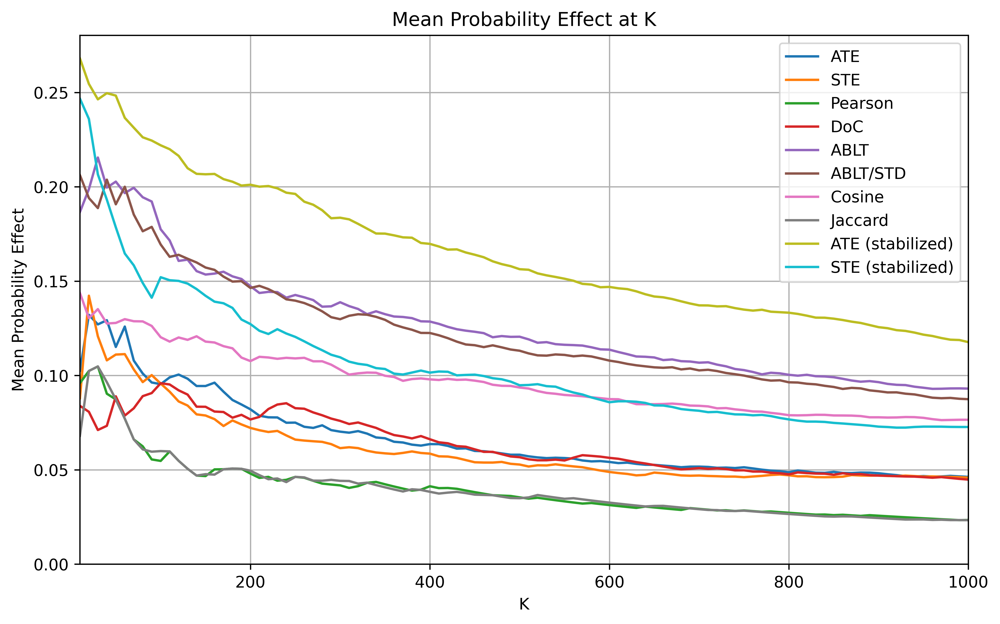

In [18]:
Ks = np.arange(10, 1001, step=10)

plt.figure(figsize=(10, 6), dpi=600)

for col in baselines:
    col_ser = raw_results.sort_values(by=col, ascending=False)['causal_effect']
    mean_at_K = [col_ser[:k].mean() for k in Ks]
    plt.plot(Ks, mean_at_K, label=col)

plt.xlabel('K')
plt.ylabel('Mean Probability Effect')
plt.title('Mean Probability Effect at K')

plt.xlim(min(Ks), max(Ks))
plt.ylim(0)

plt.legend()
plt.grid()
plt.show()


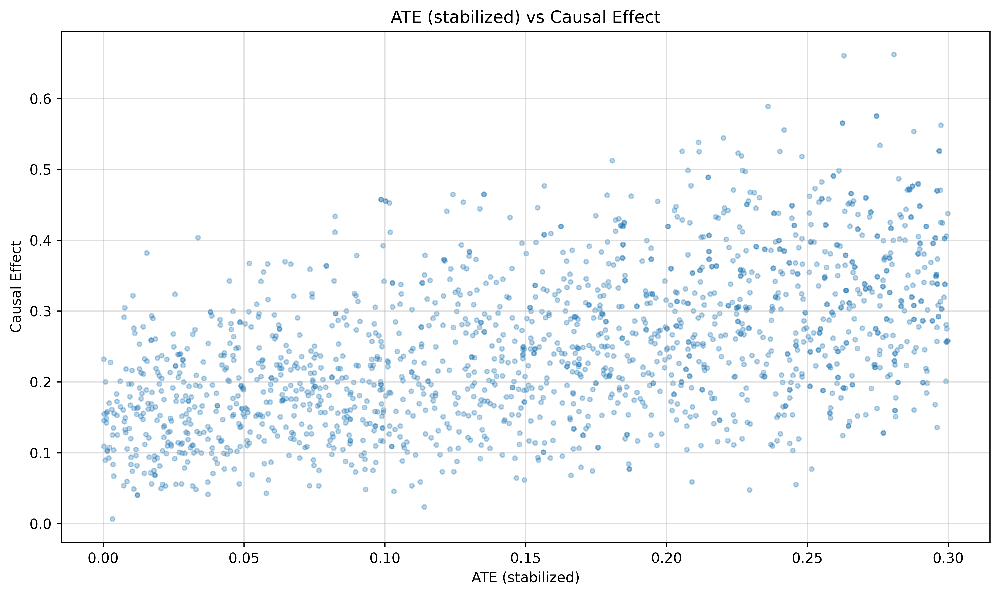

In [20]:
plt.figure(figsize=(10, 6), dpi=600)

subset = raw_results[raw_results['causal_effect'] > 0]
estimator = 'ATE (stabilized)'
# estimator = 'ABLT'

plt.scatter(
    subset['causal_effect'],
    subset[estimator],
    alpha=0.3,
    s=10
)
plt.xlabel(estimator)
plt.ylabel('Causal Effect')
plt.title(f'{estimator} vs Causal Effect')
plt.grid(alpha=0.4)

# axes[1].set_xlim(-15)
plt.tight_layout()
plt.savefig(
    base_artifacts / 'Figures' / 'simulation' / 'scatter_ate_vs_ste_causal_effect_(linked_only).jpeg',
    bbox_inches='tight'
)
plt.show()
